In [1]:
import pandas as pd
import numpy as np
import scipy as sp
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline

import time

np.random.seed(555)

In [42]:
import pdblp
import datetime

import joblib
import shutil
from tempfile import mkdtemp

# connect to bloomberg
con = pdblp.BCon(debug=True, port=8194, timeout=5000)
con.start()
con.debug = False

# ensure results during bad connections
temp_dir = mkdtemp()
cacher = joblib.Memory(temp_dir)
bdh = cacher.cache(con.bdh, ignore=['self'])


## FF model test

In [101]:
writer = pd.ExcelWriter('aapldata.xlsx')
mydata1.to_excel(writer, 'part1-d')
mydata2.to_excel(writer, 'part2-d')
mydata3.to_excel(writer, 'part3-q')

In [98]:
import tensorflow as tf
import os
from tensorflow.python.layers import core as core_layers

from mpl_toolkits.mplot3d import Axes3D

def reset_graph(seed=42):
    # to make results reproducible across runs
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    np.random.seed(seed)

end_date = datetime.datetime.today().strftime('%Y%m%d') 
start_date = datetime.datetime(1985,1,1).strftime('%Y%m%d') 

fields_d = ['PX_LAST', 'PX_TO_BOOK_RATIO', 'PE_RATIO', 'CUR_MKT_CAP', 'BETA_RAW_OVERRIDABLE', 
          'PX_VOLUME', 'EQY_SH_OUT', 'EQY_DVD_YLD_IND', 'PX_TO_SALES_RATIO', 
          'MOV_AVG_10D', 'MOV_AVG_60D', 'MOV_AVG_120D', '3MO_PUT_IMP_VOL']

fields_q = ['BS_TOT_ASSET', 'CF_FREE_CASH_FLOW', 'CUR_RATIO', 'DVD_PAYOUT_RATIO', 'TOT_DEBT_TO_TOT_ASSET',
            'ASSET_TURNOVER', 'PROF_MARGIN', 'SALES_GROWTH', 'EBITDA_GROWTH', 'IS_EPS']

mydata1 = bdh('AAPL US Equity', fields_d[0:7], start_date, end_date)
mydata2 = bdh('AAPL US Equity', fields_d[7:], start_date, end_date)
mydata3 = bdh('AAPL US Equity', fields_q, start_date, end_date)

mydata3 = mydata3.dropna()

________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', [ 'PX_LAST',
  'PX_TO_BOOK_RATIO',
  'PE_RATIO',
  'CUR_MKT_CAP',
  'BETA_RAW_OVERRIDABLE',
  'PX_VOLUME',
  'EQY_SH_OUT'], 
'19850101', '20180713')
______________________________________________________________bdh - 2.4s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', [ 'EQY_DVD_YLD_IND',
  'PX_TO_SALES_RATIO',
  'MOV_AVG_10D',
  'MOV_AVG_60D',
  'MOV_AVG_120D',
  '3MO_PUT_IMP_VOL'], 
'19850101', '20180713')
______________________________________________________________bdh - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', [ 'BS_TOT_ASSET',
  'CF_FREE_CASH_FLOW',
  'CUR_RATIO',
  'DVD_PAYOUT_RATIO',
  'TOT_DEBT_TO_TOT_ASSET',
  'ASSET_TURNOVER',
  'P

In [96]:
mydata = mydata1.merge(mydata2, how='left', left_index=True, right_index=True)

In [22]:
mydata = pd.DataFrame()
for i in range(len(fields)):
    tmp = bdh('AAPL US Equity', fields[i], start_date, end_date)
    mydata = pd.concat([mydata,tmp], axis=1)

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "PX_LAST"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'PX_LAST', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1985-01-02
                PX_LAST = 0.497800
            }
            fieldData = {
                date = 1985-01-03
                PX_LAST = 0.506700
            }
            fieldData = {
                date = 1985-01-04
                PX_LAST = 0.506700
            }
            fieldData = {
                date = 1985-01-07
                PX_LAST = 0.504500
            }
            fieldData = {
                date = 1985-01-08
                PX_LAST = 0.500000
            }
            fieldData = {
                date = 1985-01-09
                PX_LAST = 0.513400
            }
            fieldData = {
                date = 1985-01-10
                PX_LAST = 0.535700
        

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "PX_TO_BOOK_RATIO"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 1.0s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'PX_TO_BOOK_RATIO', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1989-12-29
                PX_TO_BOOK_RATIO = 2.896200
            }
            fieldData = {
                date = 1990-01-02
                PX_TO_BOOK_RATIO = 3.060600
            }
            fieldData = {
                date = 1990-01-03
                PX_TO_BOOK_RATIO = 3.081100
            }
            fieldData = {
                date = 1990-01-04
                PX_TO_BOOK_RATIO = 3.091400
            }
            fieldData = {
                date = 1990-01-05
                PX_TO_BOOK_RATIO = 3.101700
            }
            fieldData = {
                date = 1990-01-08
                PX_TO_BOOK_RATIO = 3.122200
            }
            fieldData = {
                date = 

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "PE_RATIO"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'PE_RATIO', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1990-09-28
                PE_RATIO = 7.692300
            }
            fieldData = {
                date = 1990-10-01
                PE_RATIO = 8.090200
            }
            fieldData = {
                date = 1990-10-02
                PE_RATIO = 7.858100
            }
            fieldData = {
                date = 1990-10-03
                PE_RATIO = 7.161800
            }
            fieldData = {
                date = 1990-10-04
                PE_RATIO = 7.427100
            }
            fieldData = {
                date = 1990-10-05
                PE_RATIO = 7.427100
            }
            fieldData = {
                date = 1990-10-08
                PE_RATIO = 7.725500
 

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "CUR_MKT_CAP"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'CUR_MKT_CAP', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1988-01-12
                CUR_MKT_CAP = 5295.695900
            }
            fieldData = {
                date = 1988-01-13
                CUR_MKT_CAP = 5327.217900
            }
            fieldData = {
                date = 1988-01-14
                CUR_MKT_CAP = 5327.217900
            }
            fieldData = {
                date = 1988-01-15
                CUR_MKT_CAP = 5406.022900
            }
            fieldData = {
                date = 1988-01-18
                CUR_MKT_CAP = 5390.261900
            }
            fieldData = {
                date = 1988-01-19
                CUR_MKT_CAP = 5390.261900
            }
            fieldData = {
                date = 1988-01-20
 

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "BETA_RAW_OVERRIDABLE"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 1.2s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'BETA_RAW_OVERRIDABLE', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1985-01-02
                BETA_RAW_OVERRIDABLE = 1.645200
            }
            fieldData = {
                date = 1985-01-03
                BETA_RAW_OVERRIDABLE = 1.641200
            }
            fieldData = {
                date = 1985-01-04
                BETA_RAW_OVERRIDABLE = 1.639700
            }
            fieldData = {
                date = 1985-01-07
                BETA_RAW_OVERRIDABLE = 1.676500
            }
            fieldData = {
                date = 1985-01-08
                BETA_RAW_OVERRIDABLE = 1.668100
            }
            fieldData = {
                date = 1985-01-09
                BETA_RAW_OVERRIDABLE = 1.671200
            }
            fieldData = {

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "PX_VOLUME"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 2.4s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'PX_VOLUME', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1985-01-02
                PX_VOLUME = 43825600.000000
            }
            fieldData = {
                date = 1985-01-03
                PX_VOLUME = 41652800.000000
            }
            fieldData = {
                date = 1985-01-04
                PX_VOLUME = 34316800.000000
            }
            fieldData = {
                date = 1985-01-07
                PX_VOLUME = 42728000.000000
            }
            fieldData = {
                date = 1985-01-08
                PX_VOLUME = 35280000.000000
            }
            fieldData = {
                date = 1985-01-09
                PX_VOLUME = 41680800.000000
            }
            fieldData = {
                date = 

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "EQY_SH_OUT"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'EQY_SH_OUT', '19850101', '20180712')


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.
pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "FNCL_LVRG"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}

pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1990-03-30
                FNCL_LVRG = 1.817700
            }
            fieldData = {
                date = 1990-06-29
                FNCL_LVRG = 1.852700
            }
            fieldData = {
                date = 1990-09-28
                FNCL_LVRG

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "MOV_AVG_10D"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 0.9s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'FNCL_LVRG', '19850101', '20180712')
______________________________________________________________bdh - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'MOV_AVG_10D', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1985-01-02
                MOV_AVG_10D = 0.498400
            }
            fieldData = {
                date = 1985-01-03
                MOV_AVG_10D = 0.498000
            }
            fieldData = {
                date = 1985-01-04
                MOV_AVG_10D = 0.499600
            }
            fieldData = {
                date = 1985-01-07
                MOV_AVG_10D = 0.501100
            }
            fieldData = {
                date = 1985-01-08
                MOV_AVG_10D = 0.502900
            }
            fieldData = {
                date = 1985-01-09
                MOV_AVG_10D = 0.505100
            }
            fieldData = {
                date = 1985-01-10
                MOV

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "MOV_AVG_60D"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 1.0s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'MOV_AVG_60D', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1985-01-02
                MOV_AVG_60D = 0.452900
            }
            fieldData = {
                date = 1985-01-03
                MOV_AVG_60D = 0.454000
            }
            fieldData = {
                date = 1985-01-04
                MOV_AVG_60D = 0.455100
            }
            fieldData = {
                date = 1985-01-07
                MOV_AVG_60D = 0.456400
            }
            fieldData = {
                date = 1985-01-08
                MOV_AVG_60D = 0.457700
            }
            fieldData = {
                date = 1985-01-09
                MOV_AVG_60D = 0.459400
            }
            fieldData = {
                date = 1985-01-10
                MOV

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "MOV_AVG_120D"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 1.0s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', 'MOV_AVG_120D', '19850101', '20180712')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1985-01-02
                MOV_AVG_120D = 0.466200
            }
            fieldData = {
                date = 1985-01-03
                MOV_AVG_120D = 0.466500
            }
            fieldData = {
                date = 1985-01-04
                MOV_AVG_120D = 0.466900
            }
            fieldData = {
                date = 1985-01-07
                MOV_AVG_120D = 0.467300
            }
            fieldData = {
                date = 1985-01-08
                MOV_AVG_120D = 0.467700
            }
            fieldData = {
                date = 1985-01-09
                MOV_AVG_120D = 0.468200
            }
            fieldData = {
                date = 1985-01-10
             

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "AAPL US Equity"
    }
    fields[] = {
        "3MO_PUT_IMP_VOL"
    }
    startDate = "19850101"
    endDate = "20180712"
    overrides[] = {
    }
}



______________________________________________________________bdh - 1.0s, 0.0min
________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh('AAPL US Equity', '3MO_PUT_IMP_VOL', '19850101', '20180712')


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.
pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "AAPL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 2007-05-18
                VWAP_STANDARD_DEV = 0.029300
            }
            fieldData = {
                date = 2007-05-21
                VWAP_STANDARD_DEV = 0.080500
            }
            fieldData = {
                date = 2007-05-22
                VWAP_STANDARD_DEV = 0.060300
            }
            fieldData = {
                date = 2007-05-23
                VWAP_STANDARD_DEV = 0.096500
            }
            fieldData = {
                date = 2007-05-24
        

______________________________________________________________bdh - 0.2s, 0.0min


In [97]:
mydata

ticker     AAPL US Equity                                                 \
field             PX_LAST BETA_RAW_OVERRIDABLE    PX_VOLUME  CUR_MKT_CAP   
date                                                                       
1985-01-02         0.4978               1.6452   43825600.0          NaN   
1985-01-03         0.5067               1.6412   41652800.0          NaN   
1985-01-04         0.5067               1.6397   34316800.0          NaN   
1985-01-07         0.5045               1.6765   42728000.0          NaN   
1985-01-08         0.5000               1.6681   35280000.0          NaN   
1985-01-09         0.5134               1.6712   41680800.0          NaN   
1985-01-10         0.5357               1.6777   69266400.0          NaN   
1985-01-11         0.5313               1.6861   51262400.0          NaN   
1985-01-14         0.5469               1.6729   67608800.0          NaN   
1985-01-15         0.5357               1.6718   66242400.0          NaN   
1985-01-16         0.5402               1.6721   47471200.0          NaN   
1985-01-17         0.5022               1.6780  136880800.0          NaN   
1985-01-18         0.5112               1.6778   88166400.0          NaN   
1985-01-21         0.5223               1.6667   81356800.0          NaN   
1985-01-22         0.5379               1.6580  106209600.0          NaN   
1985-01-23         0.5290               1.6479  107626400.0          NaN   
1985-01-24         0.5179               1.6497   99265600.0          NaN   
1985-01-25         0.5290               1.6443   79615200.0          NaN   
1985-01-28         0.5402               1.6246  103045600.0          NaN   
1985-01-29         0.5335               1.6181   55932800.0          NaN   
1985-01-30         0.5335               1.6181  123110400.0          NaN   
1985-01-31         0.5179               1.6172   69059200.0          NaN   
1985-02-01         0.5112               1.6427   34434400.0          NaN   
1985-02-04         0.5223               1.6508   54504800.0          NaN   
1985-02-05         0.5268               1.6585   47510400.0          NaN   
1985-02-06         0.5357               1.6576   48608000.0          NaN   
1985-02-07         0.5335               1.6539   61370400.0          NaN   
1985-02-08         0.5335               1.6554   33006400.0          NaN   
1985-02-11         0.5446               1.6268   86738400.0          NaN   
1985-02-12         0.5313               1.6318   56627200.0          NaN   
...                   ...                  ...          ...          ...   
2018-05-31       186.8700               1.0293   27482793.0  918491.8381   
2018-06-01       190.2400               1.0322   23442510.0  935055.8531   
2018-06-04       191.8300               1.0341   26266174.0  942870.9225   
2018-06-05       193.3100               1.0341   21565963.0  950145.3268   
2018-06-06       193.9800               1.0321   20933619.0  953438.4692   
2018-06-07       193.4600               1.0322   21347180.0  950882.5975   
2018-06-08       191.7000               1.0314   26656799.0  942231.9546   
2018-06-11       191.2300               1.0295   18308460.0  939921.8397   
2018-06-12       192.2800               1.0297   16911141.0  945082.7346   
2018-06-13       190.7000               1.0306   21638393.0  937316.8166   
2018-06-14       190.8000               1.0306   21610074.0  937808.3304   
2018-06-15       188.8400               1.0311   61719160.0  928174.6599   
2018-06-18       188.7400               1.0297   18484865.0  927683.1461   
2018-06-19       185.6900               1.0321   33578455.0  912691.9752   
2018-06-20       186.5000               1.0322   20628701.0  916673.2370   
2018-06-21       185.4600               1.0317   25711898.0  911561.4935   
2018-06-22       184.9200               1.0312   27200447.0  908907.3190   
2018-06-25       182.1700               1.0530   31663096.0  895390.6895   
2018-06-26       184.4300               1.0537  

In [95]:
mydata1

ticker     AAPL US Equity                                                 \
field             PX_LAST BETA_RAW_OVERRIDABLE    PX_VOLUME  CUR_MKT_CAP   
date                                                                       
1985-01-02         0.4978               1.6452   43825600.0          NaN   
1985-01-03         0.5067               1.6412   41652800.0          NaN   
1985-01-04         0.5067               1.6397   34316800.0          NaN   
1985-01-07         0.5045               1.6765   42728000.0          NaN   
1985-01-08         0.5000               1.6681   35280000.0          NaN   
1985-01-09         0.5134               1.6712   41680800.0          NaN   
1985-01-10         0.5357               1.6777   69266400.0          NaN   
1985-01-11         0.5313               1.6861   51262400.0          NaN   
1985-01-14         0.5469               1.6729   67608800.0          NaN   
1985-01-15         0.5357               1.6718   66242400.0          NaN   
1985-01-16         0.5402               1.6721   47471200.0          NaN   
1985-01-17         0.5022               1.6780  136880800.0          NaN   
1985-01-18         0.5112               1.6778   88166400.0          NaN   
1985-01-21         0.5223               1.6667   81356800.0          NaN   
1985-01-22         0.5379               1.6580  106209600.0          NaN   
1985-01-23         0.5290               1.6479  107626400.0          NaN   
1985-01-24         0.5179               1.6497   99265600.0          NaN   
1985-01-25         0.5290               1.6443   79615200.0          NaN   
1985-01-28         0.5402               1.6246  103045600.0          NaN   
1985-01-29         0.5335               1.6181   55932800.0          NaN   
1985-01-30         0.5335               1.6181  123110400.0          NaN   
1985-01-31         0.5179               1.6172   69059200.0          NaN   
1985-02-01         0.5112               1.6427   34434400.0          NaN   
1985-02-04         0.5223               1.6508   54504800.0          NaN   
1985-02-05         0.5268               1.6585   47510400.0          NaN   
1985-02-06         0.5357               1.6576   48608000.0          NaN   
1985-02-07         0.5335               1.6539   61370400.0          NaN   
1985-02-08         0.5335               1.6554   33006400.0          NaN   
1985-02-11         0.5446               1.6268   86738400.0          NaN   
1985-02-12         0.5313               1.6318   56627200.0          NaN   
...                   ...                  ...          ...          ...   
2018-05-31       186.8700               1.0293   27482793.0  918491.8381   
2018-06-01       190.2400               1.0322   23442510.0  935055.8531   
2018-06-04       191.8300               1.0341   26266174.0  942870.9225   
2018-06-05       193.3100               1.0341   21565963.0  950145.3268   
2018-06-06       193.9800               1.0321   20933619.0  953438.4692   
2018-06-07       193.4600               1.0322   21347180.0  950882.5975   
2018-06-08       191.7000               1.0314   26656799.0  942231.9546   
2018-06-11       191.2300               1.0295   18308460.0  939921.8397   
2018-06-12       192.2800               1.0297   16911141.0  945082.7346   
2018-06-13       190.7000               1.0306   21638393.0  937316.8166   
2018-06-14       190.8000               1.0306   21610074.0  937808.3304   
2018-06-15       188.8400               1.0311   61719160.0  928174.6599   
2018-06-18       188.7400               1.0297   18484865.0  927683.1461   
2018-06-19       185.6900               1.0321   33578455.0  912691.9752   
2018-06-20       186.5000               1.0322   20628701.0  916673.2370   
2018-06-21       185.4600               1.0317   25711898.0  911561.4935   
2018-06-22       184.9200               1.0312   27200447.0  908907.3190   
2018-06-25       182.1700               1.0530   31663096.0  895390.6895   
2018-06-26       184.4300               1.0537  

## Step1: copula for variables

#### -- Set input as your selected security, 3-month USD Libor, Implied Vol

In [22]:
# S5INFT - S&P 500 technology sector index returns, denoted by x, 
# US0003M - risk free rate, denoted by y, 
# VIX - implied vol, denoted by z
input_var = ['AAPL US Equity', 'US0003M Index', 'VIX Index']

end_date = datetime.datetime.today().strftime('%Y%m%d') 
start_date = (datetime.datetime.today()-datetime.timedelta(8000)).strftime('%Y%m%d') 

In [23]:

df = bdh(input_var, 'PX_LAST', start_date, end_date)
df.columns = df.columns.droplevel(-1)

# fill NA with last day's quote
df = df.fillna(method='ffill')

# convert r and vol to real scale
df['US0003M Index'] = df['US0003M Index'] / 100
df['VIX Index'] = df['VIX Index'] / 100

df['Equity Return'] = df[input_var[0]] / df[input_var[0]].shift(63) - 1
df['US0003M Return'] = df['US0003M Index'] / df['US0003M Index'].shift(63) - 1
df['VIX Return'] = df['VIX Index'] / df['VIX Index'].shift(63) - 1
df.dropna(inplace=True)

pdblp.pdblp:INFO:Sending Request:
 HistoricalDataRequest = {
    securities[] = {
        "DAL US Equity", "US0003M Index", "VIX Index"
    }
    fields[] = {
        "PX_LAST"
    }
    startDate = "19960815"
    endDate = "20180711"
    overrides[] = {
    }
}

pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "DAL US Equity"
        eidData[] = {
        }
        sequenceNumber = 0
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 2007-04-26
                PX_LAST = 22.790000
            }
            fieldData = {
                date = 2007-04-27
                PX_LAST = 20.910000
            }
            fieldData = {
                date = 2007-04-30
                PX_LAST = 20.450000
            }
            fieldData = {
                date = 2007-05-01
                PX_LAST = 19.910000
            }
            fieldData = {
                date = 2007-

________________________________________________________________________________
[Memory] Calling pdblp.pdblp.bdh...
bdh(['DAL US Equity', 'US0003M Index', 'VIX Index'], 'PX_LAST', '19960815', '20180711')


pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "US0003M Index"
        eidData[] = {
        }
        sequenceNumber = 1
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1996-08-15
                PX_LAST = 5.500000
            }
            fieldData = {
                date = 1996-08-16
                PX_LAST = 5.500000
            }
            fieldData = {
                date = 1996-08-19
                PX_LAST = 5.500000
            }
            fieldData = {
                date = 1996-08-20
                PX_LAST = 5.500000
            }
            fieldData = {
                date = 1996-08-21
                PX_LAST = 5.500000
            }
            fieldData = {
                date = 1996-08-22
                PX_LAST = 5.492190
            }
            fieldData = {
                date = 1996-08-23
                PX_LAST = 5.484380
         

pdblp.pdblp:INFO:Message Received:
 HistoricalDataResponse = {
    securityData = {
        security = "VIX Index"
        eidData[] = {
        }
        sequenceNumber = 2
        fieldExceptions[] = {
        }
        fieldData[] = {
            fieldData = {
                date = 1996-08-15
                PX_LAST = 15.460000
            }
            fieldData = {
                date = 1996-08-16
                PX_LAST = 14.810000
            }
            fieldData = {
                date = 1996-08-19
                PX_LAST = 15.270000
            }
            fieldData = {
                date = 1996-08-20
                PX_LAST = 14.730000
            }
            fieldData = {
                date = 1996-08-21
                PX_LAST = 14.520000
            }
            fieldData = {
                date = 1996-08-22
                PX_LAST = 13.710000
            }
            fieldData = {
                date = 1996-08-23
                PX_LAST = 14.180000
      

______________________________________________________________bdh - 0.8s, 0.0min


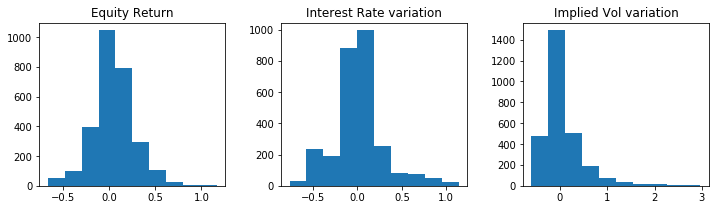

In [24]:
# briefly see their distributions 
fig = plt.figure(figsize=(12,3))
plt.subplots_adjust(wspace=0.3)
plt.subplot(131)
plt.title('Equity Return')
plt.hist(df['Equity Return'])
plt.subplot(132)
plt.title('Interest Rate variation')
plt.hist(df['US0003M Return'])
plt.subplot(133)
plt.title('Implied Vol variation')
plt.hist(df['VIX Return'])
plt.show()

In [25]:
df_x, mu_x, sigma_x = stats.t.fit(df['Equity Return'])
df_y, mu_y, sigma_y = stats.t.fit(df['US0003M Return'])
df_z, mu_z, sigma_z = stats.t.fit(df['VIX Return'])
print(df_x, df_y, df_z)

5.23424373483 2.11827514369 2.07570059938


In [26]:
df1 = sp.matrix([df['Equity Return'], df['US0003M Return'], df['VIX Return']]).T
# generate copula
mu = np.zeros(3)
cov, _ = stats.spearmanr(df1)

n_var = 3
# start with a master set of 50000 scenarios
n_iter = 50000

x0, y0, z0 = np.random.multivariate_normal(mu, cov, n_iter).T
x1, y1, z1 = stats.norm.cdf([x0, y0, z0])

#x = stats.norm.ppf(x1, loc=mu_x, scale=sigma_x)
x = stats.t.ppf(x1, df_x, loc=mu_x, scale=sigma_x) # df_x estimated from above fit is 2.9008166197208931 (kurtosis too high)
y = stats.t.ppf(y1, df_y, loc=mu_y, scale=sigma_y)
z = stats.t.ppf(z1, df_z, loc=mu_z, scale=sigma_z)

# pd.DataFrame(sp.matrix([x,y,z]).T).to_csv('rvGenerated.csv', index=False)
# pd.read_csv('rvGenerated.csv').head()

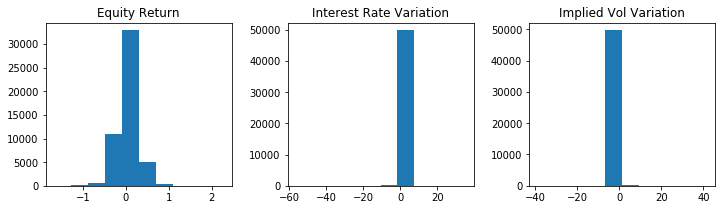

In [27]:
fig2 = plt.figure(figsize=(12,3))
plt.subplots_adjust(wspace=0.3)
plt.subplot(131)
plt.title('Equity Return')
plt.hist(x)
plt.subplot(132)
plt.title('Interest Rate Variation')
plt.hist(y)
plt.subplot(133)
plt.title('Implied Vol Variation')
plt.hist(z)
plt.show()

<br>
## Step2: generate returns

### i) optimization settings:

In [28]:
# s0 = df_equity['MSFT US Equity'][-1]
s0 = df[input_var[0]][-1]
r0 = df['US0003M Index'][-1] 
# sigma0 = df['VIX Index'][-1] 
sigma0 = df['Equity Return'].std() * 2

# suppose 30 options with different strike price from OTM to ITM put
if s0 < 80: multiplier = 1
elif s0 < 1500: multiplier = 2.5
else: multiplier = 5
    
K = np.linspace(-14, 15, 30) * multiplier + (s0//multiplier * multiplier)

# suppose that we renew the puts every 3 months, 
# so at the beginning of every hedge time horizon, 
# there would be a portfolio of S&P 500 equity and 3-month puts
T = 3/12 

# confidence level 99%
alpha = 0.05

# compare budget of 1% and 5% 
riskbudget1 = 0.01/30 
riskbudget5 = 0.05/30 

# choose 1000/5000/100000 subsamples
n_test = 1000

### ii) random set to do optimization process

In [29]:

# function for put price with BS formula
def BSput(s, K, sigma, dT, r):
    d_plus = (np.log(s/K) + (r + 0.5 * sigma**2) * dT) / (sigma * np.sqrt(dT))
    d_minus = d_plus - sigma * np.sqrt(dT)
    return np.exp(-r * dT) * (K * stats.norm.cdf(-d_minus) - s * stats.norm.cdf(-d_plus))


r_equity = []
r_option = []
for j in range(n_test):

    # create a random number to bootstrap from eps
    # rnd = np.int(np.random.uniform(0,3000))
    
    # r_equity.append(df_equity['AAPL_return'][rnd] + x[rnd])
    # s1 = s0 * (1 + r_equity[j])
    r_equity.append(x[j])
    s1 = s0 * (1 + x[j])
    r1 = r0 * (1 + y[j])
    sigma1 = sigma0 * (1 + z[j])

    r_opt = []
    for i in range(len(K)):
        r_opt.append(BSput(s1, K[i], sigma1, T, r1) / BSput(s0, K[i], sigma0, T, r0) - 1)

    r_option.append(r_opt)



C:\Apps\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in log
  after removing the cwd from sys.path.
C:\Apps\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Apps\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Apps\lib\site-packages\scipy\stats\_distn_infrastructure.py:1738: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


### iii) customize optimization functions with different risk budgets

In [30]:
from scipy.optimize import minimize
from scipy.optimize import OptimizeResult


def CVaR(w):
    
    # r_equity is 1*n vector
    # r_option is 30*n matrix
    # w is 30*1 vector
    
    r_total = sp.matrix(r_equity) + sp.dot(sp.matrix(w), sp.matrix(r_option).T)
    
    n = int(np.floor(r_total.shape[1] * alpha))
    
    # convert negative return to absolute value in loss
    return -np.mean(np.sort(r_total)[0, 0:n])


def custmin1(fun, x0, args=(), maxfev=None, stepsize=0.001,
        maxiter=1000, callback=None, **options):
    bestx = x0
    besty = fun(x0)
    funcalls = 1
    niter = 0
    improved = True
    stop = False

    while improved and not stop and niter < maxiter:
        improved = False
        niter += 1
        for dim in range(np.size(x0)):
            
            # make sure risk budget is satisfied, and no short 
            if sum(bestx) < 0.01 and bestx[dim] - stepsize >= 0:
                for s in [bestx[dim] - stepsize, bestx[dim] + stepsize]:
                    testx = np.copy(bestx)
                    testx[dim] = s
                    testy = fun(testx, *args)
                    funcalls += 1
                    if testy < besty:
                        besty = testy
                        bestx = testx
                        improved = True
            if callback is not None:
                callback(bestx)
            if maxfev is not None and funcalls >= maxfev:
                stop = True
                break

    return OptimizeResult(fun=besty, x=bestx, nit=niter,
                          nfev=funcalls, success=(niter > 1))


def custmin5(fun, x0, args=(), maxfev=None, stepsize=0.001,
        maxiter=1000, callback=None, **options):
    bestx = x0
    besty = fun(x0)
    funcalls = 1
    niter = 0
    improved = True
    stop = False

    while improved and not stop and niter < maxiter:
        improved = False
        niter += 1
        for dim in range(np.size(x0)):
            
            # make sure risk budget is satisfied, and no short 
            if sum(bestx) < 0.05 and bestx[dim] - stepsize >= 0:
                for s in [bestx[dim] - stepsize, bestx[dim] + stepsize]:
                    testx = np.copy(bestx)
                    testx[dim] = s
                    testy = fun(testx, *args)
                    funcalls += 1
                    if testy < besty:
                        besty = testy
                        bestx = testx
                        improved = True
            if callback is not None:
                callback(bestx)
            if maxfev is not None and funcalls >= maxfev:
                stop = True
                break

    return OptimizeResult(fun=besty, x=bestx, nit=niter,
                          nfev=funcalls, success=(niter > 1))



### iv) Use above optimization to find w vector that minimize CVaR at 99%

In [31]:
start_time = time.time()

w1 = [0.5 * riskbudget1] * 30
res1 = minimize(CVaR, w1, method=custmin1, options=dict(stepsize=0.00001))
w_opt1 = res1.x


w5 = [0.5 * riskbudget5] * 30
res5 = minimize(CVaR, w5, method=custmin5, options=dict(stepsize=0.00001))
w_opt5 = res5.x

print("With 0.01 budget, CVaR is %.6f" % CVaR(w_opt1))
print("With 0.05 budget, CVaR is %.6f" % CVaR(w_opt5))
print()
print("Cell Completed in %.4f seconds.", time.time() - start_time)

With 0.01 budget, CVaR is 0.380193
With 0.05 budget, CVaR is 0.208693

Cell Completed in %.4f seconds. 18.176817655563354


In [32]:
print("Optimal Weights under 0.01 budget: ", w_opt1)
print("Budget used: ", sum(w_opt1))
print()
print("Optimal Weights under 0.05 budget: ", w_opt5)
print("Budget used: ", sum(w_opt5))

Optimal Weights under 0.01 budget:  [ 0.00033667  0.00033667  0.00033667  0.00033667  0.00033667  0.00033667
  0.00033667  0.00033667  0.00033667  0.00033667  0.00033667  0.00033667
  0.00033667  0.00033667  0.00033667  0.00033667  0.00033667  0.00033667
  0.00033667  0.00033667  0.00033667  0.00032667  0.00032667  0.00032667
  0.00032667  0.00032667  0.00032667  0.00032667  0.00032667  0.00032667]
Budget used:  0.01001

Optimal Weights under 0.05 budget:  [  8.33333333e-05   1.23333333e-04   1.63333333e-04   1.32333333e-03
   1.86333333e-03   1.86333333e-03   1.86333333e-03   1.86333333e-03
   1.86333333e-03   1.86333333e-03   1.86333333e-03   1.86333333e-03
   1.86333333e-03   1.86333333e-03   1.86333333e-03   1.86333333e-03
   1.85333333e-03   1.85333333e-03   1.85333333e-03   1.85333333e-03
   1.85333333e-03   1.85333333e-03   1.85333333e-03   1.85333333e-03
   1.85333333e-03   1.85333333e-03   1.85333333e-03   1.85333333e-03
   1.85333333e-03   1.85333333e-03]
Budget used:  0.05


<br>
## Step3: Train the optimal weights with master sample set

In [33]:
def my_PnL(n_train, w_opt):
    r_equity = []
    r_option = []
    for j in range(n_train):

        # create a random number to bootstrap from eps
        rnd = np.int(np.random.uniform(3001,50000))
        # r_equity.append(df_equity['MSFT_return'].sample())
        # s1 = s0 * (1 + r_equity[j])
        r_equity.append(x[rnd])
        s1 = s0 * (1 + x[rnd])
        r1 = r0 * (1 + y[rnd])
        sigma1 = sigma0 * (1 + z[rnd])

        r_opt = []
        for i in range(len(K)):
            r_opt.append(BSput(s1, K[i], sigma1, T, r1) / BSput(s0, K[i], sigma0, T, r0) - 1)

        r_option.append(r_opt)

    r_total = sp.matrix(r_equity) + sp.dot(sp.matrix(w_opt), sp.matrix(r_option).T)
    r_equity = np.sort(r_equity)
    r_total = np.sort(r_total)
    
    return r_equity[~np.isnan(r_equity)], r_total[~np.isnan(r_total)]


In [34]:
start_time = time.time()

n_train = 5000

# store the sorted 3-month returns 
unhedge1, hedge1 = my_PnL(n_train, w_opt1)
unhedge5, hedge5 = my_PnL(n_train, w_opt5)

print("Optimization Completed in %.4f seconds." % (time.time() - start_time))

C:\Apps\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in log
  after removing the cwd from sys.path.
C:\Apps\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Apps\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Apps\lib\site-packages\scipy\stats\_distn_infrastructure.py:1738: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


Optimization Completed in 80.3635 seconds.


With Riskbudget 1% in SPY puts: 


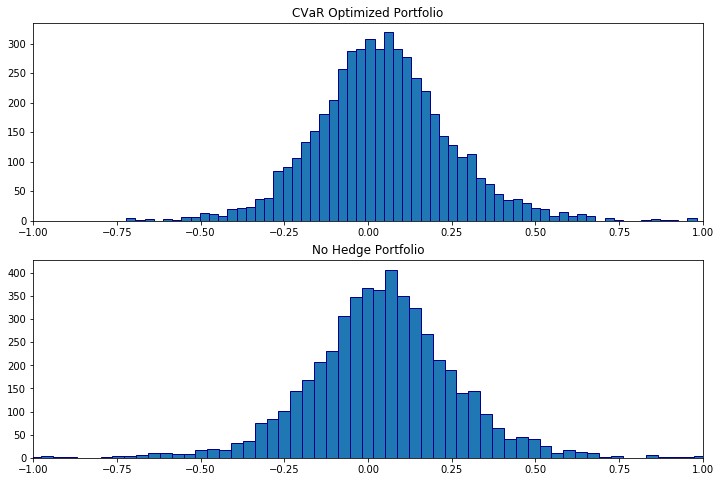

CVaR Optimized Portfolio:  {'Mean': 0.046556432004134181, 'VaR': 0.26352196012640156, 'CVaR': 0.36383553197913715, 'Best': 2.0259616490561654, 'Worst': -0.72246114750530444, 'Std': 0.20521428727106955, 'Right CVaR': 0.53044367300605577}

No Hedge Portfolio:  {'Mean': 0.041945806915740118, 'VaR': 0.30713378958353638, 'CVaR': 0.47060308279787666, 'Best': 2.035971649034181, 'Worst': -1.5075626956468433, 'Std': 0.22838558358167793, 'Right CVaR': 0.54686074277614916}


With Riskbudget 5% in SPY puts: 


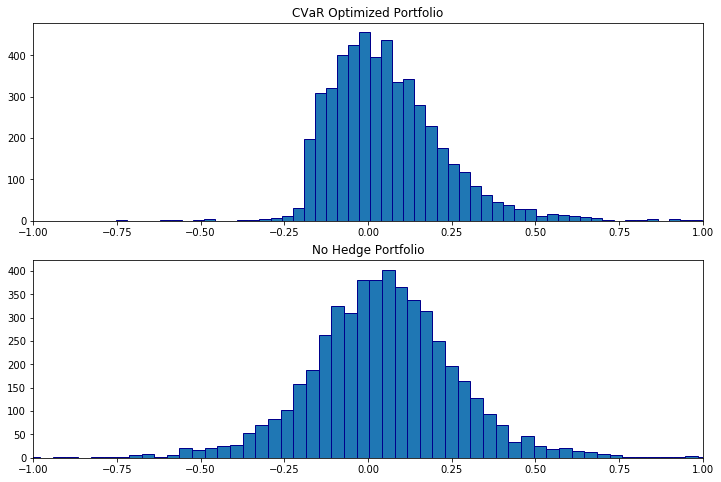

CVaR Optimized Portfolio:  {'Mean': 0.055987512775740773, 'VaR': 0.15990123185900493, 'CVaR': 0.2017490950646707, 'Best': 2.2203424563526002, 'Worst': -1.0841400515241377, 'Std': 0.1737096798976297, 'Right CVaR': 0.51272354754910487}

No Hedge Portfolio:  {'Mean': 0.045835990095160137, 'VaR': 0.30955301733843377, 'CVaR': 0.44862184337249611, 'Best': 2.2703424563526005, 'Worst': -1.5075626956468433, 'Std': 0.22677986076668408, 'Right CVaR': 0.5597512786279395}


In [35]:
n = int(np.floor(n_train* alpha))


# for 1% budget
Hedge1 = {'Mean': np.mean(hedge1), 'VaR': -hedge1[0, n], 'CVaR': -np.mean(hedge1[0, 0:n]),
         'Best': hedge1[0,-1], 'Worst': hedge1[0,0], 'Std': np.std(hedge1), 'Right CVaR': np.mean(hedge1[0, -n:])}

NoHedge1 = {'Mean': np.mean(unhedge1), 'VaR': -unhedge1[n], 'CVaR': -np.mean(unhedge1[0:n]),
         'Best': unhedge1[-1], 'Worst': unhedge1[0], 'Std': np.std(unhedge1), 'Right CVaR': np.mean(unhedge1[-n:])}

PnL_figure1 = plt.figure(figsize=(12,8))
plt.subplots_adjust(wspace=0.3)
plt.subplot(211)
plt.title('CVaR Optimized Portfolio')
tmp = np.array(hedge1)[0]
plt.hist(tmp, 100, edgecolor='darkblue')
plt.xlim(-1, 1)
plt.subplot(212)
plt.title('No Hedge Portfolio')
plt.hist(unhedge1, 100, edgecolor='darkblue')
plt.xlim(-1, 1)
print("With Riskbudget 1% in SPY puts: ")
plt.show()
print('CVaR Optimized Portfolio: ', Hedge1)
print()
print('No Hedge Portfolio: ', NoHedge1)


# for 5% budget
Hedge5 = {'Mean': np.mean(hedge5), 'VaR': -hedge5[0, n], 'CVaR': -np.mean(hedge5[0, 0:n]),
         'Best': hedge5[0,-1], 'Worst': hedge5[0,0], 'Std': np.std(hedge5), 'Right CVaR': np.mean(hedge5[0, -n:])}

NoHedge5 = {'Mean': np.mean(unhedge5), 'VaR': -unhedge5[n], 'CVaR': -np.mean(unhedge5[0:n]),
         'Best': unhedge5[-1], 'Worst': unhedge5[0], 'Std': np.std(unhedge5), 'Right CVaR': np.mean(unhedge5[-n:])}

PnL_figure5 = plt.figure(figsize=(12,8))
plt.subplots_adjust(wspace=0.3)
plt.subplot(211)
plt.title('CVaR Optimized Portfolio')
tmp = np.array(hedge5)[0]
plt.hist(tmp, 100, edgecolor='darkblue')
plt.xlim(-1, 1)
plt.subplot(212)
plt.title('No Hedge Portfolio')
plt.hist(unhedge5, 100, edgecolor='darkblue')
plt.xlim(-1, 1)
print()
print()
print("With Riskbudget 5% in SPY puts: ")
plt.show()
print('CVaR Optimized Portfolio: ', Hedge5)
print()
print('No Hedge Portfolio: ', NoHedge5)


## Step4: Test with other risk budget 

In [36]:
def custmin8(fun, x0, args=(), maxfev=None, stepsize=0.001,
        maxiter=1000, callback=None, **options):
    bestx = x0
    besty = fun(x0)
    funcalls = 1
    niter = 0
    improved = True
    stop = False

    while improved and not stop and niter < maxiter:
        improved = False
        niter += 1
        for dim in range(np.size(x0)):
            
            # make sure risk budget is satisfied, and no short 
            if sum(bestx) < 0.08 and bestx[dim] - stepsize >= 0:
                for s in [bestx[dim] - stepsize, bestx[dim] + stepsize]:
                    testx = np.copy(bestx)
                    testx[dim] = s
                    testy = fun(testx, *args)
                    funcalls += 1
                    if testy < besty:
                        besty = testy
                        bestx = testx
                        improved = True
            if callback is not None:
                callback(bestx)
            if maxfev is not None and funcalls >= maxfev:
                stop = True
                break

    return OptimizeResult(fun=besty, x=bestx, nit=niter,
                          nfev=funcalls, success=(niter > 1))

riskbudget8 = 0.08/30
w8 = [0.5 * riskbudget8] * 30
res8 = minimize(CVaR, w8, method=custmin8, options=dict(stepsize=0.00001))
w_opt8 = res8.x

sum(w_opt8), CVaR(w_opt8)

(0.080000000000000085, 0.17427263324715245)

In [37]:
def custmin10(fun, x0, args=(), maxfev=None, stepsize=0.001,
        maxiter=1000, callback=None, **options):
    bestx = x0
    besty = fun(x0)
    funcalls = 1
    niter = 0
    improved = True
    stop = False

    while improved and not stop and niter < maxiter:
        improved = False
        niter += 1
        for dim in range(np.size(x0)):
            
            # make sure risk budget is satisfied, and no short 
            if sum(bestx) < 0.1 and bestx[dim] - stepsize >= 0:
                for s in [bestx[dim] - stepsize, bestx[dim] + stepsize]:
                    testx = np.copy(bestx)
                    testx[dim] = s
                    testy = fun(testx, *args)
                    funcalls += 1
                    if testy < besty:
                        besty = testy
                        bestx = testx
                        improved = True
            if callback is not None:
                callback(bestx)
            if maxfev is not None and funcalls >= maxfev:
                stop = True
                break

    return OptimizeResult(fun=besty, x=bestx, nit=niter,
                          nfev=funcalls, success=(niter > 1))

riskbudget10 = 0.1/30
w10 = [0.5 * riskbudget10] * 30
res10 = minimize(CVaR, w10, method=custmin10, options=dict(stepsize=0.00001))
w_opt10 = res10.x
sum(w_opt10), CVaR(w_opt10)

(0.10000999999999949, 0.15843630480607437)

In [38]:
def custmin20(fun, x0, args=(), maxfev=None, stepsize=0.001,
        maxiter=1000, callback=None, **options):
    bestx = x0
    besty = fun(x0)
    funcalls = 1
    niter = 0
    improved = True
    stop = False

    while improved and not stop and niter < maxiter:
        improved = False
        niter += 1
        for dim in range(np.size(x0)):
            
            # make sure risk budget is satisfied, and no short 
            if sum(bestx) < 0.2 and bestx[dim] - stepsize >= 0:
                for s in [bestx[dim] - stepsize, bestx[dim] + stepsize]:
                    testx = np.copy(bestx)
                    testx[dim] = s
                    testy = fun(testx, *args)
                    funcalls += 1
                    if testy < besty:
                        besty = testy
                        bestx = testx
                        improved = True
            if callback is not None:
                callback(bestx)
            if maxfev is not None and funcalls >= maxfev:
                stop = True
                break

    return OptimizeResult(fun=besty, x=bestx, nit=niter,
                          nfev=funcalls, success=(niter > 1))

riskbudget20 = 0.2/30
w20 = [0.5 * riskbudget20] * 30
res20 = minimize(CVaR, w20, method=custmin20, options=dict(stepsize=0.00001))
w_opt20 = res20.x
sum(w_opt20), CVaR(w_opt20)

(0.14426999999999679, 0.137225867974101)